# BNB: Distance to a Sketched Region and Gene Expression Gradient Along it
Data is obtained from 10X Genomics

In [1]:
%load_ext autoreload
%autoreload 2
%env ANYWIDGET_HMR=1

env: ANYWIDGET_HMR=1


In [2]:
import numpy as np
import pandas as pd
import json
import geopandas as gpd
import celldega as dega
from celldega.pre.boundary_tile import batch_transform_geometries, _get_name_mapping
from celldega.pre import _to_geometry
import geopandas as gpd
from shapely.geometry import Point


# Data initialization

In [3]:
# dataset_name = 'Xenium_Prime_Ovarian_Cancer_FFPE_XRrun_outs'
dataset_name = 'Xenium_V1_human_Pancreas_FFPE_outs'
tech = 'Xenium'

use_int_index = True

DATA_DIR = f'../data'
data_dir = f'{DATA_DIR}/{dataset_name}'
path_landscape_files = f'landscape_files/{dataset_name}'

## Load region polygon (both in pixel and micron space)


In [4]:
# Load Geo parquet
gdf_pixel = gpd.read_parquet(f'{path_landscape_files}/spatial_regions/sketched_regions_pixel.parquet')
gdf_micron = gpd.read_parquet(f'{path_landscape_files}/spatial_regions/sketched_regions_micron.parquet')

## Transform points from pixel space to micron space

In [5]:
# Get cell metadata
cell_meta = pd.read_parquet(f"{path_landscape_files}/cell_metadata.parquet")
cell_meta["geometry"] = cell_meta["geometry"].apply(lambda coords: Point(coords[0], coords[1]))
cell_meta_gdf = gpd.GeoDataFrame(cell_meta, geometry="geometry", crs="EPSG:4326")

# Get points
gdf_join = gdf_pixel.sjoin(cell_meta_gdf, how='right', predicate='intersects').drop(columns=['index_left'], errors='ignore')
df_cluster = pd.read_parquet(f"{path_landscape_files}/cell_clusters/cluster.parquet")
gdf_join['cluster'] = df_cluster['cluster']

if use_int_index: # For older version landscapes files, set use_int_index to False
    # Convert string index to integer index
    cell_str_to_int_mapping = _get_name_mapping(
        path_landscape_files,
        layer='boundary',
        )
    gdf_join['name'] = gdf_join['name'].map(cell_str_to_int_mapping)

gene_list = ['EPCAM']

for gene in gene_list:
    df_gene = pd.read_parquet(f"{path_landscape_files}/cbg/{gene}.parquet")
    df_gene['name'] = df_gene.index
    gdf_join = pd.merge(gdf_join, df_gene, on='name', how='left')
    
gdf_join.head()


/Users/whuan/opt/anaconda3/envs/celldega_env/lib/python3.11/site-packages/geopandas/geodataframe.py:2195: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  return geopandas.sjoin(left_df=self, right_df=df, *args, **kwargs)  # noqa: B026


,area,roi,color,name,geometry,cluster,EPCAM
0,NaN,NaN,NaN,0,POINT (2100.36000 8006.39000),<NA>,2.0
1,NaN,NaN,NaN,1,POINT (2076.74000 8168.84000),<NA>,9.0
2,NaN,NaN,NaN,2,POINT (2193.19000 8057.69000),<NA>,5.0
3,NaN,NaN,NaN,3,POINT (2027.57000 8035.13000),<NA>,1.0
4,NaN,NaN,NaN,4,POINT (2240.52000 8052.18000),<NA>,6.0


In [6]:
path_transformation_matrix = f'{path_landscape_files}/micron_to_image_transform.csv'

transformation_matrix = pd.read_csv(
    path_transformation_matrix, header=None, sep=" "
).values

# From pixel to micron space
inverse_matrix = np.linalg.inv(transformation_matrix)
gdf_join_micron = gdf_join.copy()
gdf_join_micron["geometry"] = batch_transform_geometries(gdf_join_micron["geometry"], inverse_matrix, 1)
gdf_join_micron['geometry'] = gdf_join_micron['geometry'].apply(_to_geometry)
gdf_join_micron.head()

,area,roi,color,name,geometry,cluster,EPCAM
0,NaN,NaN,NaN,0,POINT (446.32653 1701.35800),<NA>,2.0
1,NaN,NaN,NaN,1,POINT (441.30728 1735.87863),<NA>,9.0
2,NaN,NaN,NaN,2,POINT (466.05291 1712.25925),<NA>,5.0
3,NaN,NaN,NaN,3,POINT (430.85866 1707.46525),<NA>,1.0
4,NaN,NaN,NaN,4,POINT (476.11054 1711.08838),<NA>,6.0


# Select a polygon and calculate the distance from all cells to it

Extract the polygon for the specified ROI: region_1
Distances from points to polygon region_1 were calculated.
Plotting distances from points to polygon region_1...


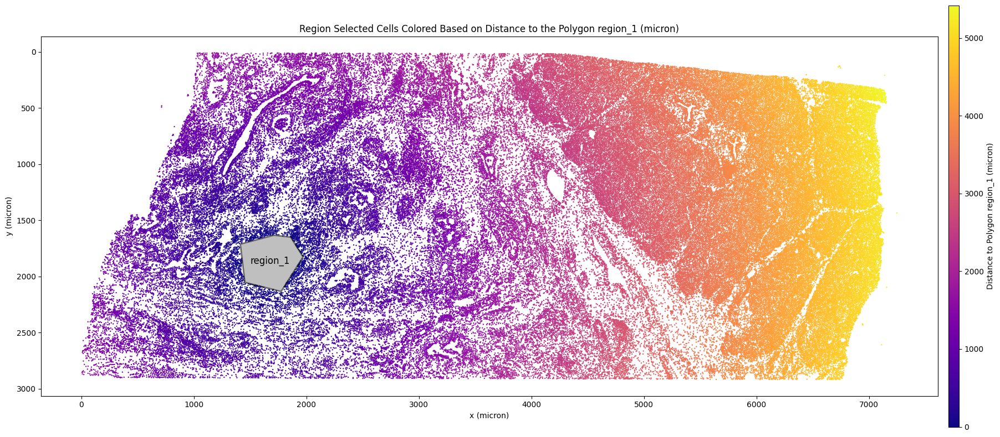

In [7]:
# Specify the polygon
roi_name = 'region_1'

# Calculate distances
gdf_points_with_dist, gdf_polygon = dega.pre.calc_distance_to_polygon(
    gdf_micron, 
    gdf_join_micron, 
    roi_name
)

# Plot distances
dega.pre.plot_distance_to_polygon(
    gdf_points_with_dist, 
    gdf_polygon, 
    roi_name,
    markersize=0.5
)


# Plot gene expression gradient along the distance to selected polygon

Plotting gene expression gradient from points to polygon region_1...


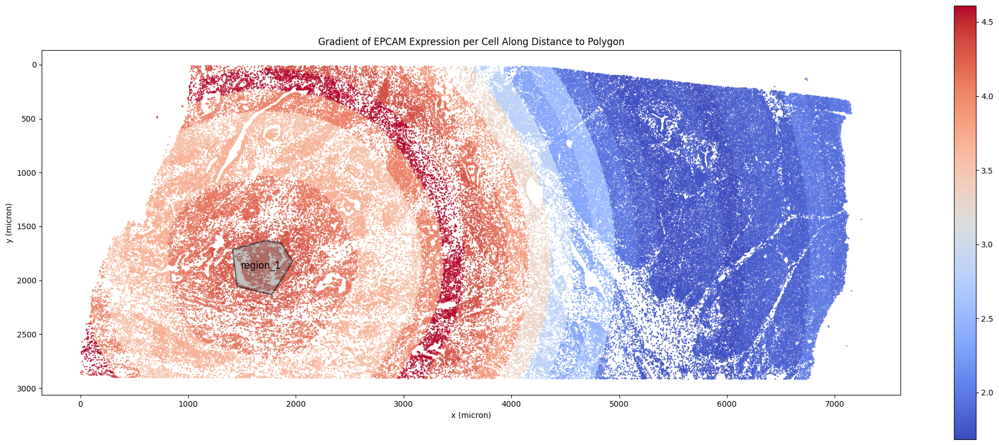

Gradient bands saved to landscape_files/Xenium_V1_human_Pancreas_FFPE_outs/gdf_200_um_bands_from_region_1_micron.parquet


In [25]:

# Calculate gene gradients
band_width = 200
gdf_join_all, gdf_bands = dega.pre.calc_gene_gradient_to_polygon(
    gdf_points_with_dist,
    gdf_polygon,
    roi_name,
    band_width=band_width,
    num_bands=5,
    gene_list=gene_list
)

# Plot gene gradients
dega.pre.plot_gene_gradient_to_polygon(
    gdf_join_all,
    gdf_polygon,
    roi_name,
    gene_list=gene_list,
    markersize=1
)

# Save bands to Parquet
gradient_region_parquet_file_micron = f"{path_landscape_files}/gdf_{band_width}_um_bands_from_{roi_name}_micron.parquet"
dega.pre.save_bands_to_parquet(gdf_bands,gradient_region_parquet_file_micron)

<Axes: >

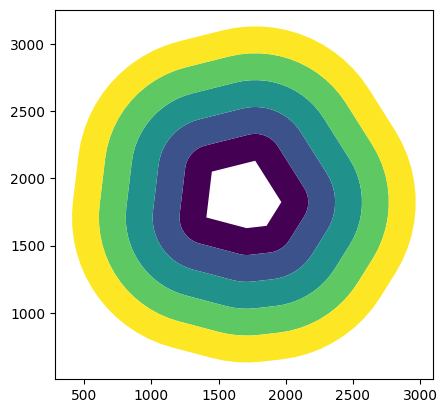

In [50]:
gdf_bands_micron.plot('band', aspect=1)